In [1]:
import os

import tensorflow as tf

from tensorflow.keras import layers

import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

2023-04-29 04:41:08.815757: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
DATA_DIR = "images/"
BATCH_SIZE = 128
IMAGE_SHAPE = (64, 64, 3)
LATENT_DIM = 128
EPOCHS = 300

In [3]:
for filename in os.listdir(DATA_DIR):
    file_path = os.path.join(DATA_DIR, filename)
    
    if os.path.isfile(file_path):
        with Image.open(file_path) as im:
            width, height = im.size
            if width < 64 or height < 64:
                os.unlink(file_path)

In [4]:
dataset = tf.keras.utils.image_dataset_from_directory(
    DATA_DIR,
    label_mode=None,
    labels=None,
    shuffle=True,
    seed=42,
    image_size=IMAGE_SHAPE[:-1],
    batch_size=None
)

Found 57236 files belonging to 1 classes.


2023-04-29 04:41:17.415670: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1635] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22077 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4090, pci bus id: 0000:c1:00.0, compute capability: 8.9


In [5]:
rescaling = layers.Rescaling(1. / 127.5, offset=-1)

In [6]:
dataset = dataset.map(lambda x: rescaling(x), num_parallel_calls=tf.data.AUTOTUNE)

In [7]:
dataset = dataset.batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE)

In [8]:
def build_generator(latent_dim):
    input_layer = layers.Input(shape=(latent_dim,))
    
    x = layers.Dense(4 * 4 * 1024, use_bias=False)(input_layer)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    x = layers.Reshape((4, 4, 1024))(x)

    x = layers.Conv2DTranspose(512, kernel_size=(5, 5), strides=(2, 2), padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2DTranspose(256, kernel_size=(5, 5), strides=(2, 2), padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    x = layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(2, 2), padding="same", use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    output_layer = layers.Conv2DTranspose(
        3, 
        kernel_size=(5, 5), 
        strides=(2, 2), 
        padding="same", 
        use_bias=False, 
        activation="tanh"
    )(x)

    model = tf.keras.Model(inputs=input_layer, outputs=output_layer)

    return model

In [9]:
def build_discriminator():
    input_layer = layers.Input(shape=IMAGE_SHAPE)
    
    x = layers.Conv2D(64, kernel_size=(5, 5), strides=(2, 2), padding="same")(input_layer)
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(128, kernel_size=(5, 5), strides=(2, 2), padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(256, kernel_size=(5, 5), strides=(2, 2), padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Conv2D(512, kernel_size=(5, 5), strides=(2, 2), padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)
    x = layers.Dropout(0.3)(x)

    x = layers.Flatten()(x)
    output_layer = layers.Dense(1)(x)

    model = tf.keras.Model(inputs=input_layer, outputs=output_layer)

    return model

In [10]:
class WGAN(tf.keras.Model):
    def __init__(self, generator, discriminator, latent_dim, gp_weight=10):
        super(WGAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.latent_dim = latent_dim
        self.gp_weight = gp_weight

    def compile(self, g_optimizer, d_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN, self).compile()
        self.g_optimizer = g_optimizer
        self.d_optimizer = d_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    def gradient_penalty(self, batch_size, real_images, fake_images):
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        interpolated_images = alpha * real_images + (1 - alpha) * fake_images

        with tf.GradientTape() as tape:
            tape.watch(interpolated_images)
            pred = self.discriminator(interpolated_images)

        gradients = tape.gradient(pred, interpolated_images)
        gradients_norm = tf.sqrt(tf.reduce_sum(tf.square(gradients), axis=[1, 2, 3]))
        gp = tf.reduce_mean((gradients_norm - 1.0) ** 2)
        return gp

    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]

        noise = tf.random.normal([batch_size, self.latent_dim])
        
        with tf.GradientTape() as d_tape:
            fake_images = self.generator(noise)
            real_output = self.discriminator(real_images)
            fake_output = self.discriminator(fake_images)

            d_loss = self.d_loss_fn(real_output, fake_output)

            gp = self.gradient_penalty(batch_size, real_images, fake_images)
            d_loss = d_loss + gp * self.gp_weight

        d_gradients = d_tape.gradient(d_loss, self.discriminator.trainable_variables)
        self.d_optimizer.apply_gradients(zip(d_gradients, self.discriminator.trainable_variables))

        noise = tf.random.normal([batch_size, self.latent_dim])
        
        with tf.GradientTape() as g_tape:
            fake_images = self.generator(noise)
            fake_output = self.discriminator(fake_images)

            g_loss = self.g_loss_fn(fake_output)

        g_gradients = g_tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(zip(g_gradients, self.generator.trainable_variables))

        return {"d_loss": d_loss, "g_loss": g_loss}

In [11]:
class ImageGridCallback(tf.keras.callbacks.Callback):
    def __init__(self, generator, latent_dim):
        self.generator = generator
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % 5 == 0:
            noise = tf.random.normal([16, self.latent_dim])
            generated_images = self.generator(noise)

            fig, axs = plt.subplots(4, 4, figsize=(4, 4))
            for i, ax in enumerate(axs.flat):
                img = (generated_images[i].numpy() * 127.5 + 127.5).astype(np.uint8)
                ax.imshow(img)
                ax.axis("off")

            plt.subplots_adjust(wspace=0, hspace=0)
            plt.suptitle(f"Epoch: {epoch+1}", fontsize=20)
            plt.show()

In [12]:
generator = build_generator(LATENT_DIM)
discriminator = build_discriminator()

In [13]:
img_cb = ImageGridCallback(generator, LATENT_DIM)

In [14]:
def g_loss_fn(fake_output):
    return -tf.reduce_mean(fake_output)

def d_loss_fn(real_output, fake_output):
    return tf.reduce_mean(fake_output) - tf.reduce_mean(real_output)

In [15]:
g_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)
d_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0002, beta_1=0.5)

In [16]:
wgan = WGAN(generator, discriminator, LATENT_DIM)

In [17]:
wgan.compile(
    g_optimizer=g_optimizer,
    d_optimizer=d_optimizer,
    g_loss_fn=g_loss_fn,
    d_loss_fn=d_loss_fn
)

Epoch 1/300


2023-04-29 04:41:18.093605: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [57236]
	 [[{{node Placeholder/_0}}]]
2023-04-29 04:41:18.093931: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [57236]
	 [[{{node Placeholder/_0}}]]
2023-04-29 04:41:21.527765: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:637] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-04-29 04:41:21.673234: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8600
2023-04-2

448/448 [==============================] - 28s 44ms/step - d_loss: -21.7678 - g_loss: 6.2720
Epoch 2/300
448/448 [==============================] - 17s 39ms/step - d_loss: -4.6973 - g_loss: 2.9205
Epoch 3/300
448/448 [==============================] - 17s 39ms/step - d_loss: -4.5218 - g_loss: 3.9874
Epoch 4/300
448/448 [==============================] - 17s 39ms/step - d_loss: -3.9225 - g_loss: 5.0310
Epoch 5/300
447/448 [============================>.] - ETA: 0s - d_loss: -3.0625 - g_loss: 5.8456

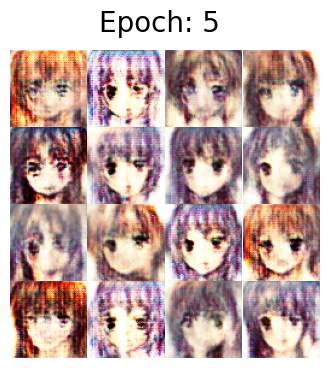

448/448 [==============================] - 18s 41ms/step - d_loss: -3.0709 - g_loss: 5.8588
Epoch 6/300
448/448 [==============================] - 17s 39ms/step - d_loss: -2.6864 - g_loss: 3.4407
Epoch 7/300
448/448 [==============================] - 17s 39ms/step - d_loss: -2.4182 - g_loss: 4.8214
Epoch 8/300
448/448 [==============================] - 18s 39ms/step - d_loss: -2.0755 - g_loss: 2.1492
Epoch 9/300
448/448 [==============================] - 17s 39ms/step - d_loss: -1.4914 - g_loss: 1.5969
Epoch 10/300
447/448 [============================>.] - ETA: 0s - d_loss: -1.4744 - g_loss: 1.5877

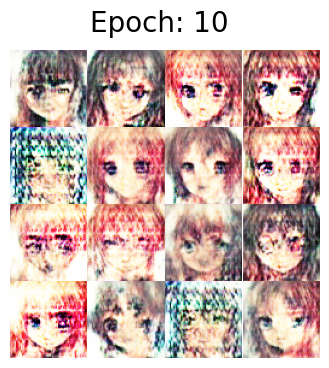

448/448 [==============================] - 18s 40ms/step - d_loss: -1.4739 - g_loss: 1.5218
Epoch 11/300
448/448 [==============================] - 18s 39ms/step - d_loss: -1.4717 - g_loss: -1.2785
Epoch 12/300
448/448 [==============================] - 18s 39ms/step - d_loss: -1.4971 - g_loss: 0.8033
Epoch 13/300
448/448 [==============================] - 17s 39ms/step - d_loss: -1.2523 - g_loss: -3.8090
Epoch 14/300
448/448 [==============================] - 17s 39ms/step - d_loss: -1.1661 - g_loss: -2.0101
Epoch 15/300
447/448 [============================>.] - ETA: 0s - d_loss: -1.1350 - g_loss: -3.0360

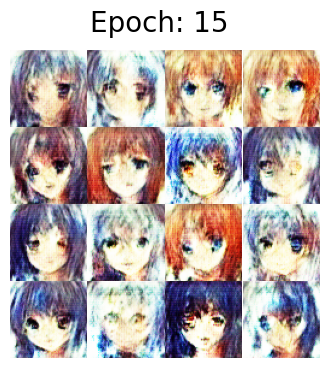

448/448 [==============================] - 18s 40ms/step - d_loss: -1.1236 - g_loss: -3.1203
Epoch 16/300
448/448 [==============================] - 17s 39ms/step - d_loss: -1.0766 - g_loss: -4.9202
Epoch 17/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.9857 - g_loss: -5.4710
Epoch 18/300
448/448 [==============================] - 17s 39ms/step - d_loss: -1.2230 - g_loss: -8.1552
Epoch 19/300
448/448 [==============================] - 17s 39ms/step - d_loss: -1.1607 - g_loss: -6.3077
Epoch 20/300
447/448 [============================>.] - ETA: 0s - d_loss: -1.1721 - g_loss: -6.2287

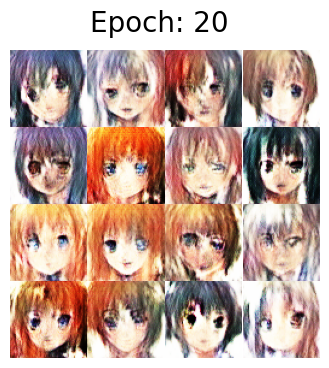

448/448 [==============================] - 18s 40ms/step - d_loss: -1.1727 - g_loss: -6.2544
Epoch 21/300
448/448 [==============================] - 18s 39ms/step - d_loss: -1.4221 - g_loss: -10.1191
Epoch 22/300
448/448 [==============================] - 18s 39ms/step - d_loss: -1.4453 - g_loss: -9.6936
Epoch 23/300
448/448 [==============================] - 18s 39ms/step - d_loss: -1.5951 - g_loss: -4.3975
Epoch 24/300
448/448 [==============================] - 18s 39ms/step - d_loss: -1.6600 - g_loss: -4.5135
Epoch 25/300
447/448 [============================>.] - ETA: 0s - d_loss: -1.5620 - g_loss: -5.3769

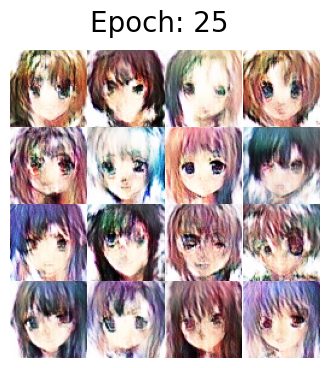

448/448 [==============================] - 18s 40ms/step - d_loss: -1.5634 - g_loss: -5.4325
Epoch 26/300
448/448 [==============================] - 17s 39ms/step - d_loss: -1.3899 - g_loss: -5.9536
Epoch 27/300
448/448 [==============================] - 18s 39ms/step - d_loss: -1.2516 - g_loss: -4.2278
Epoch 28/300
448/448 [==============================] - 17s 39ms/step - d_loss: -1.1787 - g_loss: -2.3221
Epoch 29/300
448/448 [==============================] - 18s 39ms/step - d_loss: -1.1685 - g_loss: -4.8355
Epoch 30/300
447/448 [============================>.] - ETA: 0s - d_loss: -1.0935 - g_loss: -3.3217

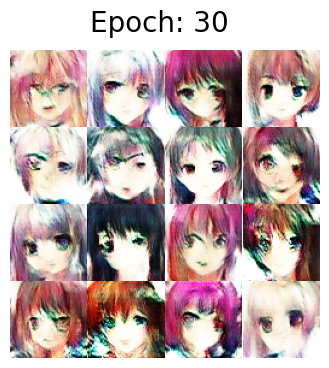

448/448 [==============================] - 18s 40ms/step - d_loss: -1.0786 - g_loss: -3.2712
Epoch 31/300
448/448 [==============================] - 17s 39ms/step - d_loss: -1.0219 - g_loss: -5.4550
Epoch 32/300
448/448 [==============================] - 17s 39ms/step - d_loss: -1.0340 - g_loss: -4.3729
Epoch 33/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8945 - g_loss: -3.4907
Epoch 34/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7630 - g_loss: -0.4032
Epoch 35/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.9887 - g_loss: -1.6984

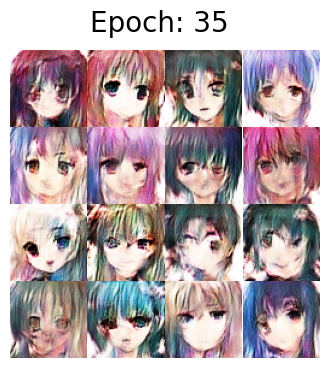

448/448 [==============================] - 18s 40ms/step - d_loss: -0.9949 - g_loss: -1.6756
Epoch 36/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8855 - g_loss: -1.1739
Epoch 37/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8314 - g_loss: -3.9126
Epoch 38/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.9179 - g_loss: -1.2064
Epoch 39/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8382 - g_loss: 0.3260
Epoch 40/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8909 - g_loss: -1.5543

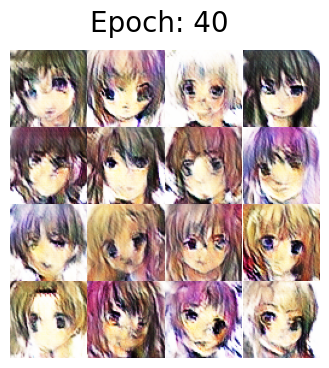

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8899 - g_loss: -1.5464
Epoch 41/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7214 - g_loss: -1.7566
Epoch 42/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8306 - g_loss: -0.4584
Epoch 43/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7472 - g_loss: -2.2570
Epoch 44/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.9624 - g_loss: -1.6817
Epoch 45/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8295 - g_loss: -2.7624

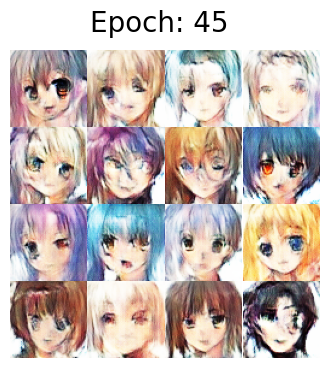

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8301 - g_loss: -2.8444
Epoch 46/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8329 - g_loss: 0.1021
Epoch 47/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7728 - g_loss: -0.8606
Epoch 48/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7373 - g_loss: -1.3225
Epoch 49/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.9307 - g_loss: -1.9342
Epoch 50/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8263 - g_loss: -0.9304

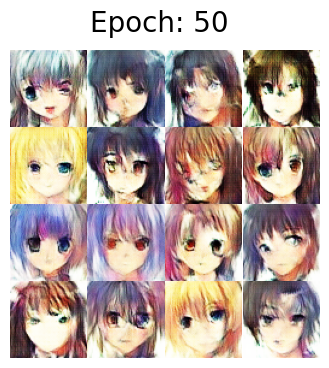

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8285 - g_loss: -0.8466
Epoch 51/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8511 - g_loss: -2.8328
Epoch 52/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8963 - g_loss: -1.3368
Epoch 53/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8405 - g_loss: -1.8274
Epoch 54/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.9067 - g_loss: -1.1291
Epoch 55/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.5030 - g_loss: 0.4377

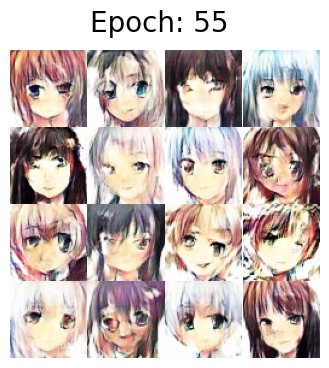

448/448 [==============================] - 18s 40ms/step - d_loss: -0.4979 - g_loss: 0.4415
Epoch 56/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.9563 - g_loss: 0.3921
Epoch 57/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.6504 - g_loss: 1.7717
Epoch 58/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7805 - g_loss: 1.1121
Epoch 59/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8899 - g_loss: 0.0129
Epoch 60/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7954 - g_loss: 2.9866

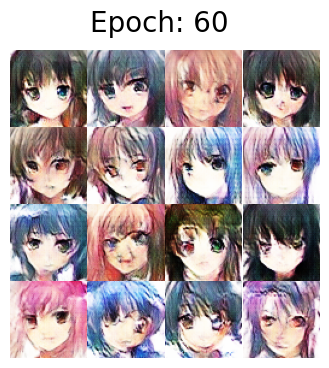

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7987 - g_loss: 2.8772
Epoch 61/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7992 - g_loss: 0.4283
Epoch 62/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8950 - g_loss: 1.9801
Epoch 63/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8624 - g_loss: 5.2161
Epoch 64/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7806 - g_loss: 4.3405
Epoch 65/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8200 - g_loss: 2.8330

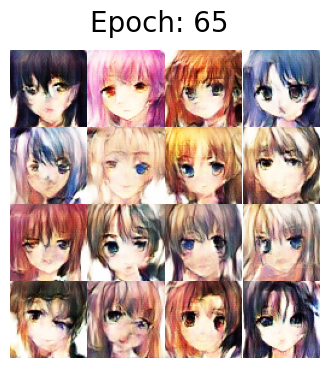

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8176 - g_loss: 2.8620
Epoch 66/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7558 - g_loss: 1.5597
Epoch 67/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8226 - g_loss: 0.9758
Epoch 68/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8637 - g_loss: 2.6057
Epoch 69/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7944 - g_loss: 2.7906
Epoch 70/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7505 - g_loss: 2.8386

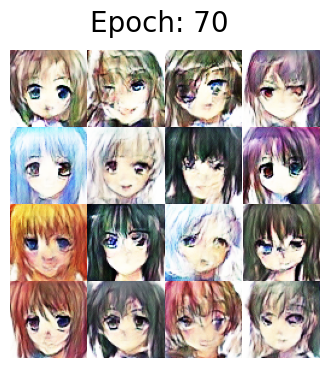

448/448 [==============================] - 18s 41ms/step - d_loss: -0.7484 - g_loss: 2.7608
Epoch 71/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7999 - g_loss: 2.9775
Epoch 72/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7301 - g_loss: 3.2012
Epoch 73/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7358 - g_loss: 2.8044
Epoch 74/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7156 - g_loss: 3.7379
Epoch 75/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7921 - g_loss: 3.2821

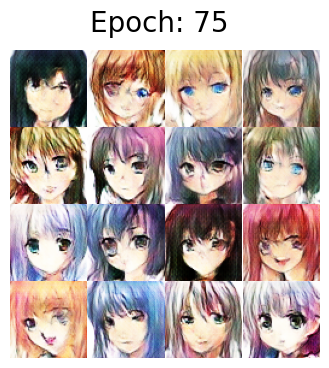

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8044 - g_loss: 3.3336
Epoch 76/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8163 - g_loss: 6.0348
Epoch 77/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7506 - g_loss: 2.6655
Epoch 78/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7230 - g_loss: 3.6328
Epoch 79/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8724 - g_loss: 3.4308
Epoch 80/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7773 - g_loss: 3.3227

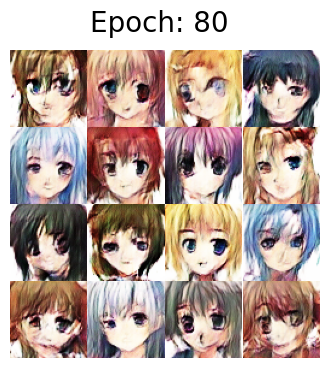

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7810 - g_loss: 3.3942
Epoch 81/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7604 - g_loss: 2.7332
Epoch 82/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7790 - g_loss: 3.0511
Epoch 83/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7864 - g_loss: 1.3231
Epoch 84/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7686 - g_loss: 6.0881
Epoch 85/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7876 - g_loss: 2.3577

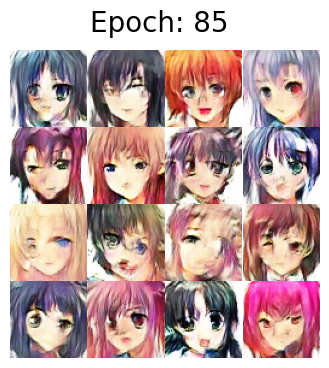

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7881 - g_loss: 2.2914
Epoch 86/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7222 - g_loss: 2.2857
Epoch 87/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7578 - g_loss: 2.2972
Epoch 88/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7899 - g_loss: 3.1269
Epoch 89/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7390 - g_loss: 4.3421
Epoch 90/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.6178 - g_loss: 4.1225

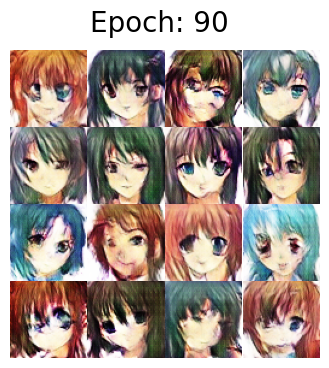

448/448 [==============================] - 18s 40ms/step - d_loss: -0.6238 - g_loss: 4.1485
Epoch 91/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7597 - g_loss: 3.1204
Epoch 92/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7523 - g_loss: 5.6979
Epoch 93/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7342 - g_loss: 3.5640
Epoch 94/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7345 - g_loss: 3.4539
Epoch 95/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.6943 - g_loss: 3.4290

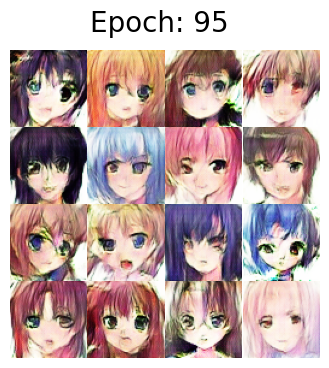

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7005 - g_loss: 3.4092
Epoch 96/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.6847 - g_loss: 2.7684
Epoch 97/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7229 - g_loss: 4.6313
Epoch 98/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.6743 - g_loss: 4.0726
Epoch 99/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7654 - g_loss: 5.0345
Epoch 100/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.6677 - g_loss: 1.3121

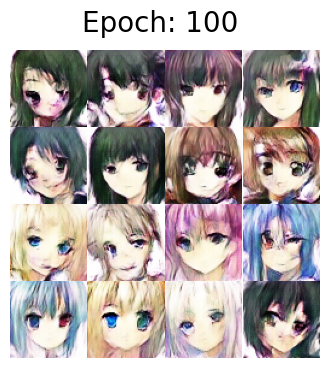

448/448 [==============================] - 18s 40ms/step - d_loss: -0.6656 - g_loss: 1.3086
Epoch 101/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7293 - g_loss: 1.8373
Epoch 102/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7183 - g_loss: 3.6094
Epoch 103/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.6368 - g_loss: 1.0304
Epoch 104/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.6989 - g_loss: 3.2605
Epoch 105/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7598 - g_loss: 3.1871

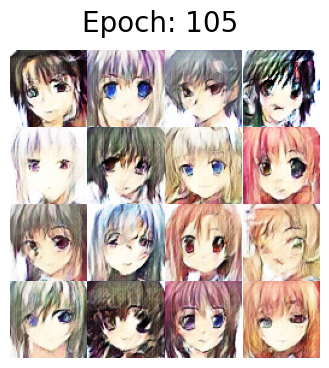

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7547 - g_loss: 3.1561
Epoch 106/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7069 - g_loss: 2.4275
Epoch 107/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8598 - g_loss: 3.7034
Epoch 108/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.6815 - g_loss: 2.3973
Epoch 109/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7491 - g_loss: 3.2379
Epoch 110/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.6454 - g_loss: 2.8321

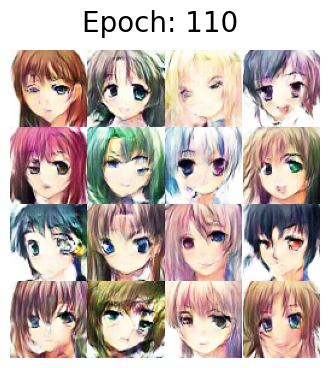

448/448 [==============================] - 18s 40ms/step - d_loss: -0.6508 - g_loss: 2.8309
Epoch 111/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8163 - g_loss: 2.7732
Epoch 112/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.6581 - g_loss: 2.7373
Epoch 113/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7805 - g_loss: 2.5653
Epoch 114/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8028 - g_loss: 2.6300
Epoch 115/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7333 - g_loss: 2.7543

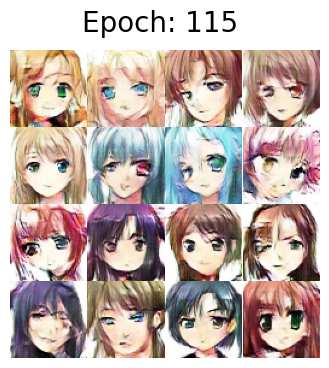

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7337 - g_loss: 2.7558
Epoch 116/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.6773 - g_loss: 2.2032
Epoch 117/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7765 - g_loss: 1.4204
Epoch 118/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8467 - g_loss: 1.9353
Epoch 119/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.6612 - g_loss: 1.8885
Epoch 120/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7510 - g_loss: 2.2301

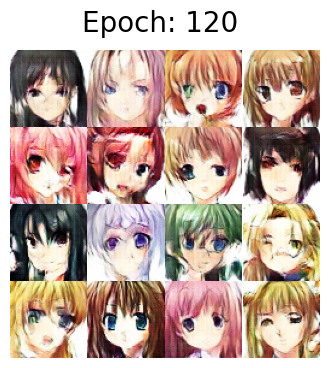

448/448 [==============================] - 18s 41ms/step - d_loss: -0.7633 - g_loss: 2.2040
Epoch 121/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7427 - g_loss: 1.4990
Epoch 122/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8216 - g_loss: 0.9534
Epoch 123/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8329 - g_loss: 1.3035
Epoch 124/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7851 - g_loss: 1.2822
Epoch 125/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7014 - g_loss: 2.0621

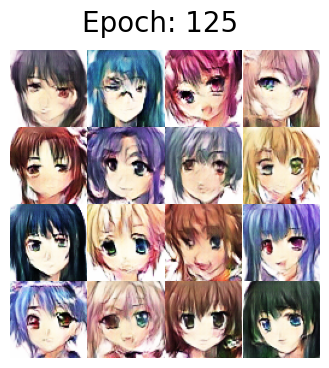

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7045 - g_loss: 2.0728
Epoch 126/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8168 - g_loss: 2.0991
Epoch 127/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7989 - g_loss: 1.1989
Epoch 128/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7750 - g_loss: 1.5862
Epoch 129/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8405 - g_loss: 1.9180
Epoch 130/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7767 - g_loss: 1.1424

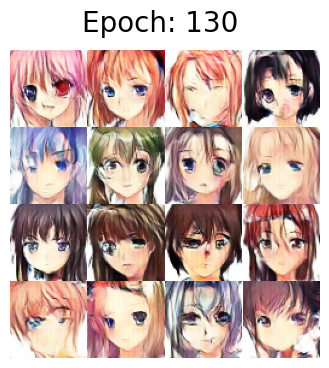

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7727 - g_loss: 1.1439
Epoch 131/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7871 - g_loss: 1.5173
Epoch 132/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.6542 - g_loss: 1.2731
Epoch 133/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.6221 - g_loss: 2.5688
Epoch 134/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7961 - g_loss: 2.1885
Epoch 135/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8692 - g_loss: 1.4060

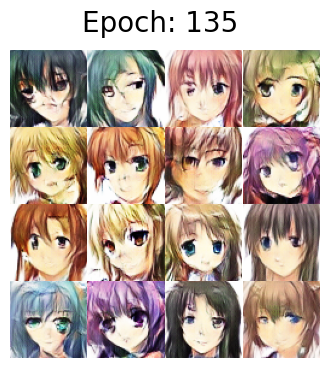

448/448 [==============================] - 18s 41ms/step - d_loss: -0.8704 - g_loss: 1.3936
Epoch 136/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8432 - g_loss: 1.0835
Epoch 137/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8392 - g_loss: 1.3422
Epoch 138/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.6794 - g_loss: 2.2363
Epoch 139/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8473 - g_loss: 1.0241
Epoch 140/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8217 - g_loss: 1.5451

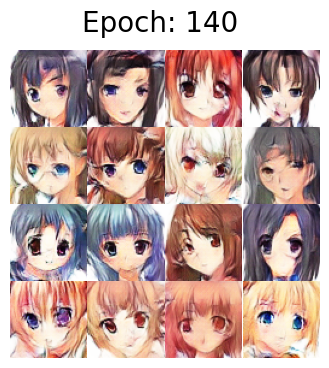

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8184 - g_loss: 1.5550
Epoch 141/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8367 - g_loss: 1.2486
Epoch 142/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8475 - g_loss: 1.0761
Epoch 143/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8354 - g_loss: 0.5446
Epoch 144/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7063 - g_loss: 1.9683
Epoch 145/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7895 - g_loss: 0.7198

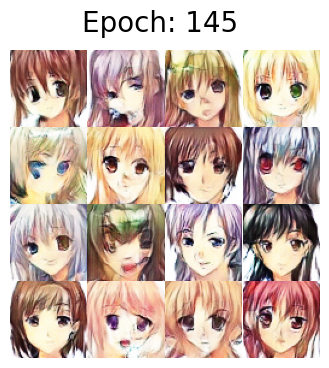

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7824 - g_loss: 0.7239
Epoch 146/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8151 - g_loss: 0.7278
Epoch 147/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7831 - g_loss: 0.7823
Epoch 148/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8305 - g_loss: 0.8156
Epoch 149/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7558 - g_loss: 1.4540
Epoch 150/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.6727 - g_loss: 1.3273

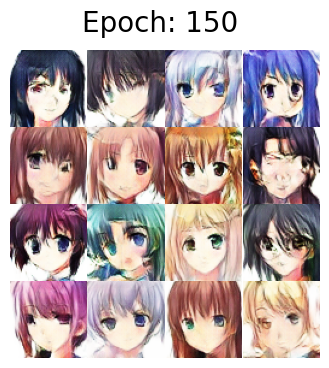

448/448 [==============================] - 18s 40ms/step - d_loss: -0.6729 - g_loss: 1.3309
Epoch 151/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7457 - g_loss: 0.8694
Epoch 152/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.6509 - g_loss: 2.6677
Epoch 153/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8443 - g_loss: 1.1717
Epoch 154/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8419 - g_loss: 0.5087
Epoch 155/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7072 - g_loss: 0.7984

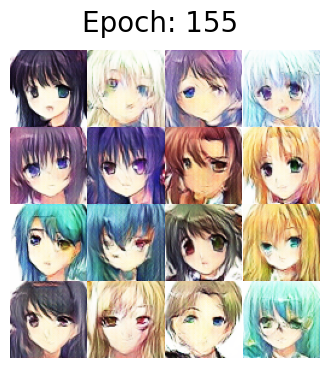

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7082 - g_loss: 0.8061
Epoch 156/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.6866 - g_loss: 1.4719
Epoch 157/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7304 - g_loss: 1.3517
Epoch 158/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8284 - g_loss: 0.0294
Epoch 159/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8769 - g_loss: -0.0039
Epoch 160/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8199 - g_loss: 0.2957

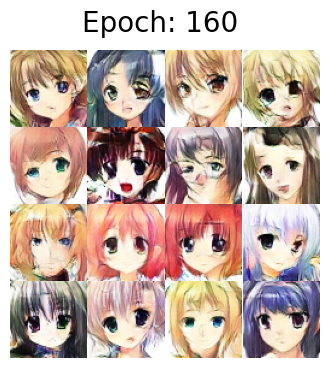

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8237 - g_loss: 0.3055
Epoch 161/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7769 - g_loss: 0.6610
Epoch 162/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8066 - g_loss: 0.5463
Epoch 163/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7557 - g_loss: 0.6896
Epoch 164/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7773 - g_loss: 1.2142
Epoch 165/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7937 - g_loss: 0.7601

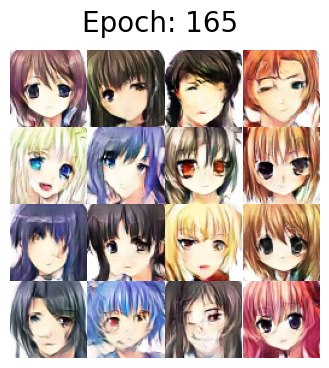

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7962 - g_loss: 0.7637
Epoch 166/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8019 - g_loss: 0.0150
Epoch 167/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7329 - g_loss: 0.5290
Epoch 168/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8113 - g_loss: 0.1790
Epoch 169/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8322 - g_loss: -0.1036
Epoch 170/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7591 - g_loss: -0.2104

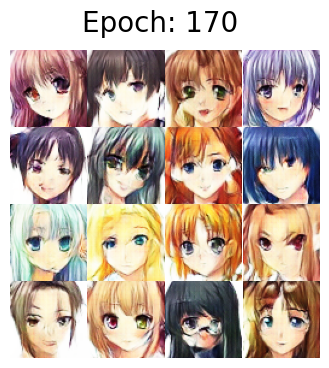

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7610 - g_loss: -0.1993
Epoch 171/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7256 - g_loss: -0.3056
Epoch 172/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7442 - g_loss: 0.3658
Epoch 173/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8644 - g_loss: -0.8454
Epoch 174/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7596 - g_loss: -0.6601
Epoch 175/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8153 - g_loss: -0.5722

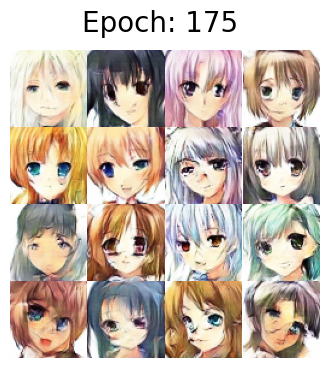

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8155 - g_loss: -0.5765
Epoch 176/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8364 - g_loss: -0.2037
Epoch 177/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7204 - g_loss: -0.3948
Epoch 178/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8608 - g_loss: -1.1608
Epoch 179/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7072 - g_loss: -0.1917
Epoch 180/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7962 - g_loss: 0.3879

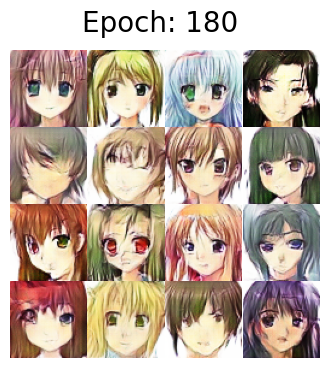

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7921 - g_loss: 0.3805
Epoch 181/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8221 - g_loss: 0.1445
Epoch 182/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7622 - g_loss: -0.0444
Epoch 183/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7950 - g_loss: 0.3700
Epoch 184/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8393 - g_loss: -0.3354
Epoch 185/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.6573 - g_loss: 1.1449

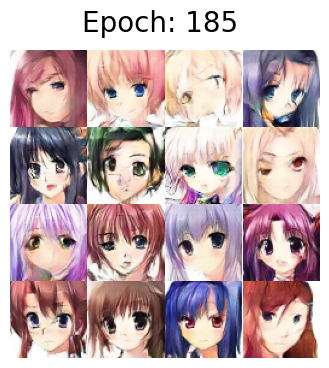

448/448 [==============================] - 18s 41ms/step - d_loss: -0.6578 - g_loss: 1.1493
Epoch 186/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8270 - g_loss: -0.1157
Epoch 187/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8582 - g_loss: -0.0082
Epoch 188/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7949 - g_loss: -0.8676
Epoch 189/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8428 - g_loss: -1.3773
Epoch 190/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7922 - g_loss: -1.4363

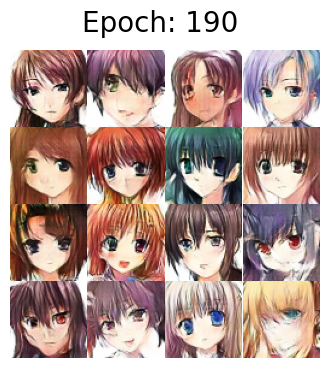

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7907 - g_loss: -1.4335
Epoch 191/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7695 - g_loss: -1.4660
Epoch 192/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8610 - g_loss: -1.3090
Epoch 193/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8254 - g_loss: -1.1936
Epoch 194/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7594 - g_loss: -0.0494
Epoch 195/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8323 - g_loss: -0.8613

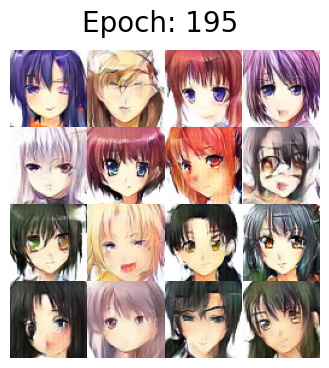

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8379 - g_loss: -0.8487
Epoch 196/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7706 - g_loss: 0.0862
Epoch 197/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8919 - g_loss: -0.9628
Epoch 198/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8054 - g_loss: -0.8029
Epoch 199/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8386 - g_loss: -1.2692
Epoch 200/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.7835 - g_loss: -1.8241

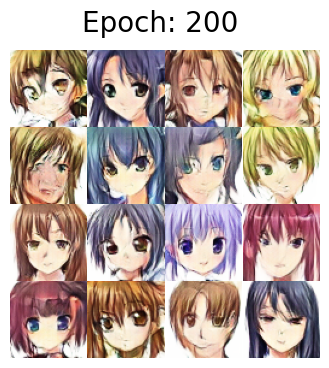

448/448 [==============================] - 18s 40ms/step - d_loss: -0.7856 - g_loss: -1.8252
Epoch 201/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8637 - g_loss: -2.3496
Epoch 202/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8307 - g_loss: -1.8799
Epoch 203/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8495 - g_loss: -3.2962
Epoch 204/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7780 - g_loss: -2.5596
Epoch 205/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8320 - g_loss: -2.6129

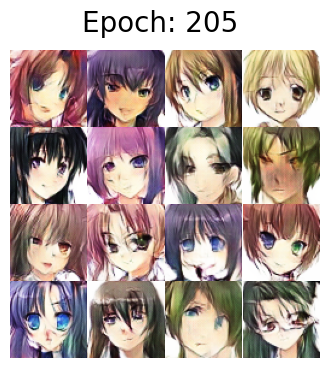

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8311 - g_loss: -2.6119
Epoch 206/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8166 - g_loss: -2.6022
Epoch 207/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8572 - g_loss: -2.5690
Epoch 208/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7815 - g_loss: -1.9174
Epoch 209/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8214 - g_loss: -2.1059
Epoch 210/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8129 - g_loss: -1.8463

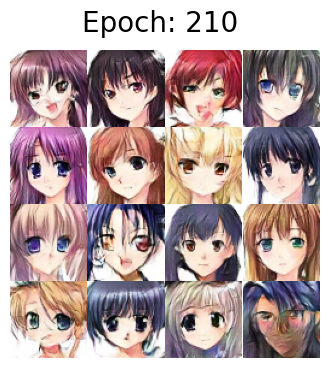

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8114 - g_loss: -1.8414
Epoch 211/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7664 - g_loss: -1.9212
Epoch 212/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8779 - g_loss: -1.7125
Epoch 213/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8822 - g_loss: -2.5751
Epoch 214/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7733 - g_loss: -2.0090
Epoch 215/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8689 - g_loss: -1.8930

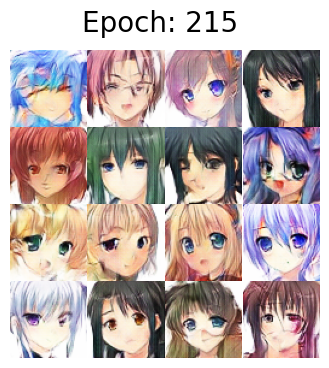

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8694 - g_loss: -1.8863
Epoch 216/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8803 - g_loss: -2.4651
Epoch 217/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.7763 - g_loss: -2.1964
Epoch 218/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8461 - g_loss: -1.6371
Epoch 219/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8893 - g_loss: -2.2643
Epoch 220/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8208 - g_loss: -1.4291

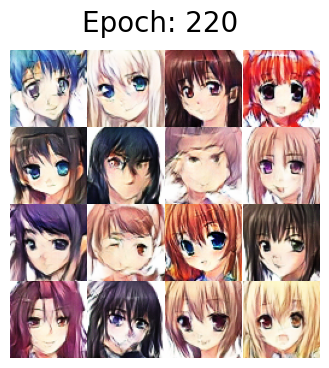

448/448 [==============================] - 18s 41ms/step - d_loss: -0.8240 - g_loss: -1.4269
Epoch 221/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8778 - g_loss: -1.8037
Epoch 222/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8727 - g_loss: -1.4642
Epoch 223/300
448/448 [==============================] - 18s 39ms/step - d_loss: -0.8145 - g_loss: -1.1065
Epoch 224/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.7907 - g_loss: -0.8958
Epoch 225/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.9004 - g_loss: -1.8595

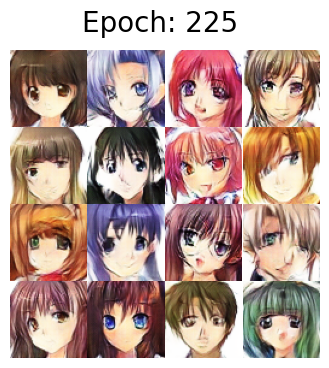

448/448 [==============================] - 18s 40ms/step - d_loss: -0.9034 - g_loss: -1.8596
Epoch 226/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8640 - g_loss: -2.1651
Epoch 227/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8990 - g_loss: -1.9661
Epoch 228/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8528 - g_loss: -2.2273
Epoch 229/300
448/448 [==============================] - 17s 39ms/step - d_loss: -0.8723 - g_loss: -1.5750
Epoch 230/300
447/448 [============================>.] - ETA: 0s - d_loss: -0.8256 - g_loss: -1.6489

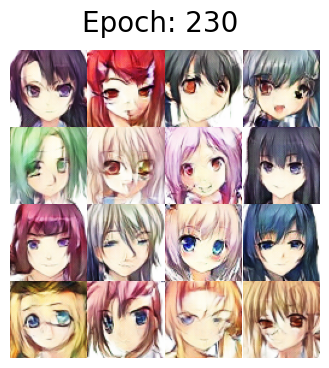

448/448 [==============================] - 18s 40ms/step - d_loss: -0.8281 - g_loss: -1.6473
Epoch 231/300
289/448 [==================>...........] - ETA: 6s - d_loss: -0.8639 - g_loss: -1.6673

In [ ]:
wgan.fit(dataset, epochs=EPOCHS, callbacks=[img_cb])